# Continous PDE Dynamics Forecasting with Implicit Neural Representations

### Yin et al., ICLR 2023

Tutorial presented by: Jaisidh Singh and Arkadijs Sergejevs

# Table of Contents

Note: we have marked our favourite part of the paper with a "❤️", and we'll discuss it in more depth when it arrives.

**Part-1:**
- Introduction & motivation
- PDE Refresher
- Method formulation

**Part-2:**
- Crisp Overview
- Deep-dive (❤️)

**Part-3:**
- PDE forecasting for a new equation!
- Evaluation & visualise main results

# Part 1

## Introduction

Partial differential equations (PDEs) are indispensible tools to model the dynamics and temporal evolution of physical phenomena. In classical methods, the dynamics described by PDEs are solved by numerical solvers, which are highly accurate but computationally slow. Recently, data produced by simulations has enabled deep learning based PDE forecasting, which is what this work deals with.

## Motivation and Problem Statement

PDE forecasting in areas like weather prediction can require extrapolation through new and arbitrary points in time or space. Current data-driven forecasting methods have notable drawbacks as they often rely on fixed discretizations of the space domain, hence they

1. Do not generalize outside the space seen during training (train grid)
2. Show poor evaluation at unobserved spatial locations and on free-form grids.
3. May not forecast well on new initial conditions
4. Cannot forecast long-term (outside training horizon).

## Proposed solution

This work presents `DINo`, a method using continuous-time dynamics of spatially continuous functions. This is done by

1. using Implicit Neural Representations (INRs) to embed spatial observations independently of how they were discretized.
2. At the same time, the temporal evolution is modeled with an ordinary differential equation (ODE) in the latent embedding space.

## PDE Refresher

**Formally**: A PDE involves a function $u(x, t)$ and its partial derivative such that

$$F(x, t, u(x, t), \frac{\partial}{\partial x}u(x, t), \frac{\partial^2}{\partial x^2}u(x, t), \dots) = 0$$

**Intuitively**: Since $u(x, t)$ is a time-varying function of space, we can also denote it as $v_t(x) = u(x, t)$ which is described by the same PDE.




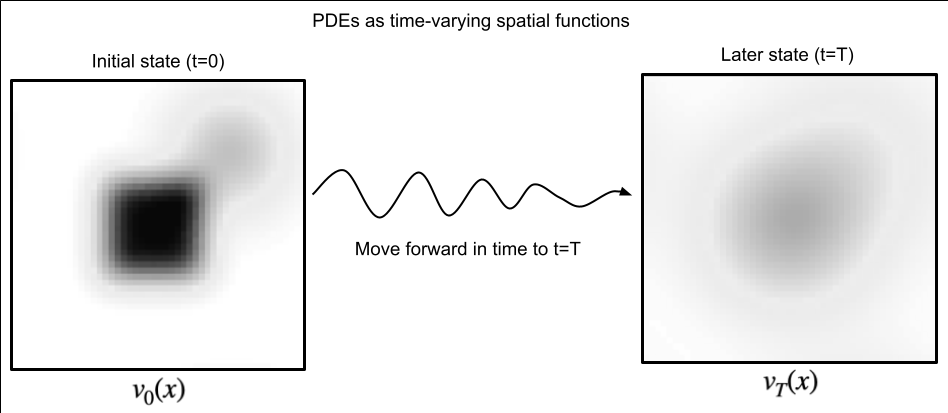

### Example: Heat Equation

Given by $\frac{\partial}{\partial t}u(x, t) = k \frac{\partial^2}{\partial x^2} u(x, t)$, this PDE is visualised in 2D space below, with $k = 0.02$ and all boundaries insulated at $0$:

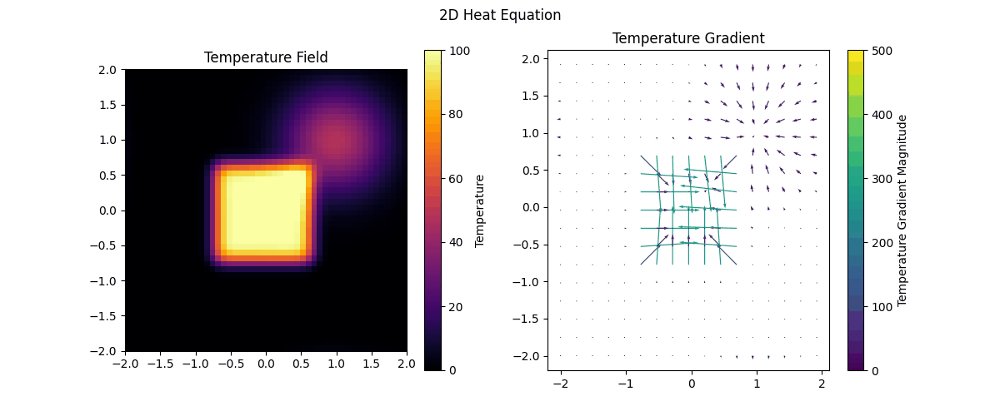

In [1]:
import numpy as np
import matplotlib.pyplot as plt
from IPython.core.display import HTML
from IPython.display import Image
from matplotlib.animation import FuncAnimation

plt.ioff()

nx, ny = 50, 50  # Number of grid points
dx = dy = 0.1    # Grid spacing
alpha = 0.02     # Thermal diffusivity
dt = 0.1         # Time step (chosen for stability)
steps = 200      # Number of animation frames
skip = 3         # Show every nth arrow

x = np.linspace(-2, 2, nx)
y = np.linspace(-2, 2, ny)
X, Y = np.meshgrid(x, y)
u = np.zeros((ny, nx))
u[ny//3:2*ny//3, nx//3:2*nx//3] = 100  # Square hot region
u += 50 * np.exp(-((X-1)**2 + (Y-1)**2)/0.5)  # Gaussian hot spot

def evolve_temperature(u):
    d2udx2 = (np.roll(u, 1, axis=1) - 2*u + np.roll(u, -1, axis=1)) / (dx**2)
    d2udy2 = (np.roll(u, 1, axis=0) - 2*u + np.roll(u, -1, axis=0)) / (dy**2)

    dudt = alpha * (d2udx2 + d2udy2)
    return u + dt * dudt

fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(12, 5))
fig.suptitle('2D Heat Equation')

heatmap = ax1.imshow(u, extent=[-2, 2, -2, 2], origin='lower',
                     cmap='inferno', vmin=0, vmax=100)
plt.colorbar(heatmap, ax=ax1, label='Temperature')
ax1.set_title('Temperature Field')

dx_temp = np.gradient(u, dx, axis=1)
dy_temp = np.gradient(u, dy, axis=0)
quiver = ax2.quiver(
    X[::skip, ::skip],
    Y[::skip, ::skip],
    dx_temp[::skip, ::skip],
    dy_temp[::skip, ::skip],
    np.sqrt(dx_temp[::skip, ::skip]**2 + dy_temp[::skip, ::skip]**2),
    cmap='viridis'
    )
plt.colorbar(quiver, ax=ax2, label='Temperature Gradient Magnitude')
ax2.set_title('Temperature Gradient')

def update(frame):
    global u

    u = evolve_temperature(u)
    heatmap.set_array(u)

    dx_temp = np.gradient(u, dx, axis=1)
    dy_temp = np.gradient(u, dy, axis=0)
    quiver.set_UVC(dx_temp[::skip, ::skip], dy_temp[::skip, ::skip],
                   np.sqrt(dx_temp[::skip, ::skip]**2 + dy_temp[::skip, ::skip]**2))

    return heatmap, quiver

ani = FuncAnimation(fig, update, frames=steps, interval=50, blit=True)
ani.save("heat_equation_2d.gif", writer="pillow")

plt.cla()
plt.clf()

Image(open("heat_equation_2d.gif", "rb").read())

## `DINo` Notation and Formulation

Given function $v_t(x)$ described by the PDE, `DINo` learns a flow $\Phi_T$ to predict the spatial function $T$ steps ahead, i.e., $v_{t+T}(x)$. Learning the flow is a common strategy in sequential models to better generalize beyond the train time horizon, such that

$$(v_t, T) \mapsto \Phi_T(v_t) = v_{t+T}$$


The flow $\Phi$ denotes the overall architecture of `DINo` that we describe next.

# Part 2

## Brief Overview of Architecture



Here's how `DINo` forecasts a PDE given its value at $t=0$, i.e., $v_0$.

1. **Encoder**: First it embeds $v_0$ to $\alpha_0 \in \mathbb{R}^{d_\alpha}$ via an encoder of spatial functions $E_\varphi(v_0) = \alpha_0$.
2. **Dynamics model**: Then it unrolls to time $t$ via a latent time-continous model (latent ODE) $f_\psi: \alpha_0 \mapsto \alpha_t$ given this initial condition. Specifically, $\frac{d\alpha_t}{dt} = f_\psi(\alpha_t)$.
3. **Decoder**: Finally, it decodes the latent vectors via a decoder $D_\phi(\alpha_t) = \tilde{v}_t$.

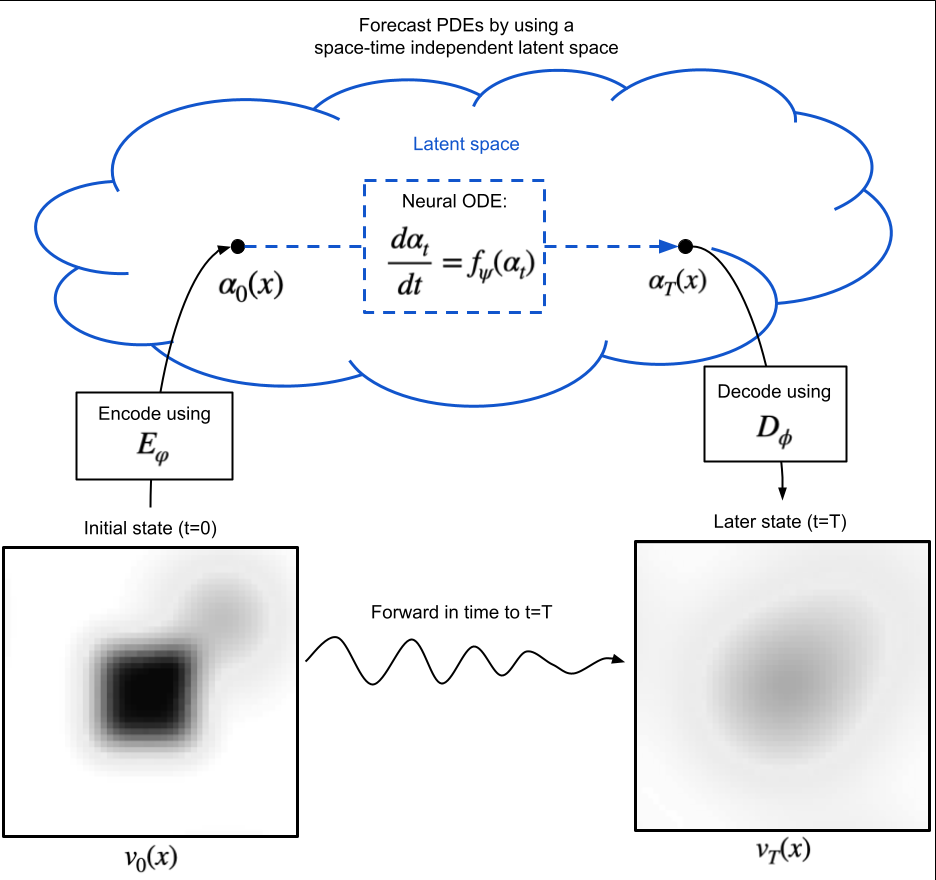

## Deep-Dive into `DINo` Architecture

### ❤️ Encoding & Decoding:

The encoder $E_\varphi$ computes $\alpha_t$ as a latent representation of the PDE at $t=t$, i.e., $E_\varphi(v_t) = \alpha_t$. Inversely, decoder $D_\phi$ decodes $\alpha_t$ to predict what $v_t(x)$ would look like by $D_\phi(\alpha_t) = \tilde{v}_t$, where $\tilde{v}_t$ is a reliable reconstruction of $v_t$.

BUT..., this is not an auto-encoder. Instead it is an *auto-DEcoder*!



 where $\|{\cdot}\|_2$ is the euclidean norm of a function and $K$ the number of update steps, auto-decoding defines $E_\varphi$ as:

$$E_\varphi(v_t) = \alpha_t^K, \quad \text{where }\alpha_t^0 = \alpha_t; \quad \forall k>0, \text{ } \alpha_t^{k+1} = \alpha_t^{k} - \eta \nabla_{\alpha_t} \mathcal{L}_{\text{dec}}(\phi,\alpha^{k}_{t};v_t) \quad \text{ and }\varphi=\phi$$

### Quick recap: Auto-encoder

Consider the reconstruction loss: $\mathcal{L}_{\text{dec}}(\phi,\alpha_{t};v_t)=\|D_\phi(\alpha_t)-v_t\|_2^2$

An *auto-encoder* would use this to update its decoder and encoder to learn the latent representations $\alpha$, as

$$\varphi \leftarrow \varphi - \eta_1 \nabla_\varphi \mathcal{L}_{\text{dec}}(\phi,\alpha_{t};v_t), \quad \text{because } E_\varphi(v_t) = \alpha_t, \text{and}$$

$$\phi \leftarrow \phi - \eta_2 \nabla_\phi \mathcal{L}_{\text{dec}}(\phi, \alpha_t; v_t), \quad \text{because } D_\phi(\alpha_t) = v_t.$$

### Auto-DEcoding: drop the encoder, learn your latents instead!

New perspective: if our decoder is expressive, then we can just learn a latent vector for a given data sample.

**Training:** With the decoder being $D_\phi$, learn a latent $\alpha_t$ using $K$ steps of gradient descent:

1. $\forall t, \alpha_t \leftarrow \alpha_t - \eta'_1 \nabla_{\alpha_t} \mathcal{L}_{\text{dec}}(\phi, \alpha_t; v_t)$

2. $\phi \leftarrow \phi - \eta'_2 \nabla_\phi \mathcal{L}_{\text{dec}}(\phi, \alpha_t; v_t)$

**Test:** Infer the latent $\tilde{\alpha}_t$ for a new data sample $\tilde{v}_t$ by taking $K$ steps of gradient descent:

$$\alpha^{k+1}_t \leftarrow \alpha^k_t - \eta'_1 \nabla_{\alpha^k_t} \mathcal{L}_{\text{dec}}(\phi, \alpha_t; v_t)$$

### Summary: Auto-encoding v/s Auto-decoding

|  Method Name  | Has Encoder | Has Decoder | Optimizes   |
|---------------|-------------|-------------|---------------------|
| Auto-encoding |     ✅      |    ✅       |$(E,D)$ for $\mathcal{L}_{\text{dec}}$ |
|Auto-decoding|❌|✅|$(\alpha, D)$ for $\mathcal{L}_{\text{dec}}$|


### Why Auto-decoding at all?

1. Underfits less
2. Do away with the need for complex encoders
3. Latents faithfully represent input data as long as decoder is strong enough.

### Let's solidify our understanding of auto-decoding with an example:

JAX is pretty helpful for this example. If you're not familiar with it, don't worry. After this trivial example, we'll switch to PyTorch for good.


In [2]:
import jax
import matplotlib.pyplot as plt

Let's set up our config and hyper-parameters for auto-decoding:

In [3]:
LATENT_DIM = 16
DATA_DIM = 512
NUM_SAMPLES = 1000
NUM_ITERATIONS = 10
SEED = 0
LATENT_LR = 1e-3
DECODER_LR = 1e-3

We now initialise our random key (which governs initialisation) and our decoder, which is just a linear layer for simplicity.

In [4]:
key = jax.random.PRNGKey(SEED)
decoder_params = jax.random.normal(key, shape=(LATENT_DIM, DATA_DIM))

latents = jax.random.normal(key, shape=(NUM_SAMPLES, LATENT_DIM))
data = jax.random.normal(key, shape=(NUM_SAMPLES, DATA_DIM))

Since JAX is highly functional, our optimisation for auto-decoding is wrapped easily as follows:

In [5]:
def compute_sample_loss(decoder_params, latent_sample, data_sample):
    squared_error = (data_sample - latent_sample @ decoder_params)**2
    return squared_error.sum()

def compute_dataset_loss(decoder_params, latents, data):
    squared_error = (data - latents @ decoder_params)**2
    return squared_error.sum(axis=(1,0))

def update_latents(decoder_params, latents, data, loss_grad_fn, learning_rate):
    for i in range(latents.shape[0]):
        latents = latents.at[i].set(latents[i] - learning_rate * loss_grad_fn(decoder_params, latents[i], data[i]))
    return latents

def update_decoder_params(decoder_params, latents, data, loss_grad_fn, learning_rate):
    decoder_params -= learning_rate * loss_grad_fn(decoder_params, latents, data)
    return decoder_params

def take_one_autodecoding_step(decoder_params, latents, data, latent_grad_fn, decoder_grad_fn, latent_lr, decoder_lr):
    latents = update_latents(decoder_params, latents, data, latent_grad_fn, latent_lr)
    decoder_params = update_decoder_params(decoder_params, latents, data, decoder_grad_fn, decoder_lr)
    loss_after_step = compute_dataset_loss(decoder_params, latents, data) / data.shape[0]
    return loss_after_step

Easily instantiate $\nabla_{\alpha_t}$ and $\nabla_\phi$ here:

In [6]:
latent_grad_fn = jax.grad(compute_sample_loss, argnums=1)
decoder_grad_fn = jax.grad(compute_dataset_loss, argnums=0)

Take an auto-decoding step:

In [7]:
mean_loss_before_training = compute_dataset_loss(decoder_params, latents, data) / data.shape[0]
print(f"Loss over the dataset before optimization step: {mean_loss_before_training}")

loss_after_step = take_one_autodecoding_step(
    decoder_params,
    latents,
    data,
    latent_grad_fn,
    decoder_grad_fn,
    latent_lr=LATENT_LR,
    decoder_lr=DECODER_LR
)

print(f"Loss over the dataset after one autodecoding step: {loss_after_step}")

Loss over the dataset before optimization step: 8619.353515625
Loss over the dataset after one autodecoding step: 712.2183837890625


In [8]:
# Architecture helper code

import torch
import torch.nn as nn
import torch.nn.functional as F
from functools import partial


class Swish(nn.Module):
    def __init__(self):
        super().__init__()
        self.beta = nn.Parameter(torch.tensor([0.5]))

    def forward(self, x):
        return (x * torch.sigmoid_(x * F.softplus(self.beta))).div_(1.1)


nls = {'relu': partial(nn.ReLU),
       'sigmoid': partial(nn.Sigmoid),
       'tanh': partial(nn.Tanh),
       'selu': partial(nn.SELU),
       'softplus': partial(nn.Softplus),
       'gelu': partial(nn.GELU),
       'swish': partial(Swish),
       'elu': partial(nn.ELU)}

class MLP(nn.Module):
    def __init__(self, code_size, hidden_size, out_size=None, nl='swish'):
        super().__init__()
        self.net = nn.Sequential(
            nn.Linear(code_size, hidden_size),
            nls[nl](),
            nn.Linear(hidden_size, hidden_size),
            nls[nl](),
            nn.Linear(hidden_size, hidden_size),
            nls[nl](),
            nn.Linear(hidden_size, code_size if out_size == None else out_size),
        )

    def forward(self, x):
        return self.net(x)


### Back to `DINo`: Decoder Nuances

Remember that auto-decoding is most effective when the decoder is highly expressive. This is also required for the latent space to evolve spatial functions over time. Hence, the decoder $D_\phi$ is chosen as an *Implicit Neural Representation (INR)*.

#### What are INRs

**Formally:** An INR $I_\theta\colon\Omega\to\mathbb{R}^n$ is a space-continuous model parameterized by $\theta\in\mathbb{R}^{d_\theta}$ defined on domain $\Omega$. It approximates functions independently of the observation grid, and thus handles irregular grids and new conditions.

**Intuitively:** Think of INRs like a super-smart compression tool. Instead of storing information about a physical system point by point (like traditional methods), INRs learn to represent the entire system using a neural network that can generate any point you want on demand.

Here's a concrete example: imagine you want to describe the temperature distribution in a room. A traditional approach would store temperatures at many specific points. Instead, an INR learns a function that can tell you the temperature at ANY point in the room - you just input the coordinates (x,y,z), and it outputs the temperature.

The "implicit" part means that the information isn't stored explicitly - it's encoded in the neural network's weights. The network learns to understand the underlying patterns and physics of the system.

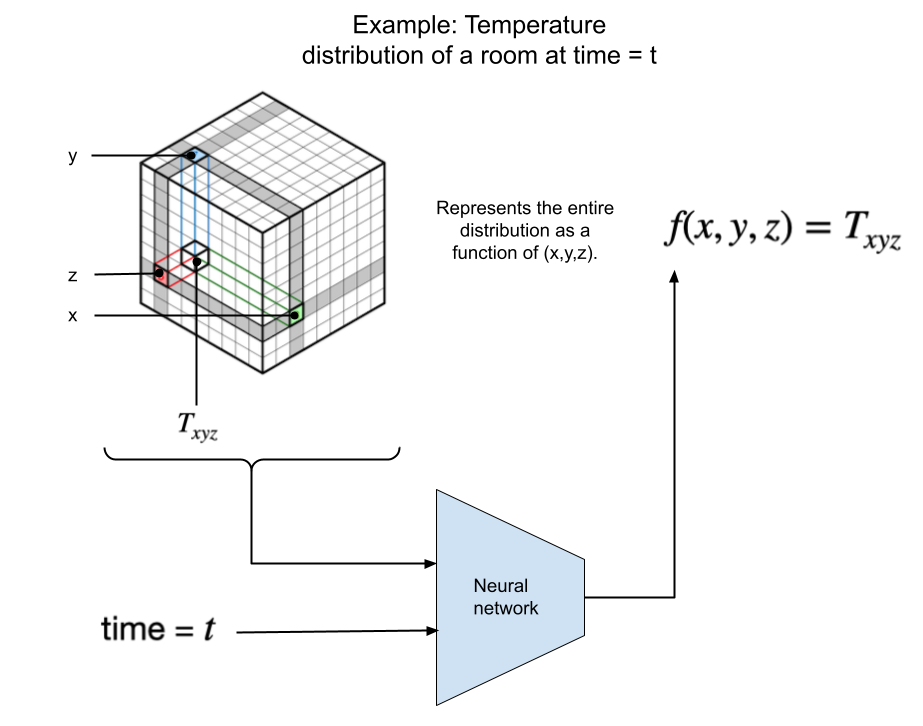

#### INRs in `DINo`

In this work, the INR in use is a `FourierNet` which can be thought of as an MLP in Fourier space. For some spatial location $x$, we first write a Fourier basis to use in layer $l$ of the INR as $s_{\omega^{(l)}}(x) = [\cos(w^{(l)})(x), \sin(w^{(l)})(x)]$. Then for every $1 \leq l \leq L$,

$$ z^{(l)}(x) = (W^{(l-1)} z^{(l-1)}(x) + b^{(l-1)}) \odot s_{\omega^{(l-1)}}(x); \quad z^{(0)}(x) = s_{\omega^{(0)}}(x) = x $$

Here, $W^{(0)} = 0, b^{(0)} = 1$ and $\odot$ is the element-wise or Hadamard product. The goal is that $\forall x, z^{(L)}(x) = v(x)$.

#### Modulating the INR

A hypernetwork is used to condition the INR's parameters $h_{\phi}\colon \mathbb{R}^{d_\alpha}\rightarrow \mathbb{R}^{d_\theta}$. It generates high-dimensional parameters $\theta_t \in {\mathbb{R}^{d_\theta}}$ of the INR given the low-dimensional latent vector $\alpha_t\in\mathbb{R}^{d_\alpha}$. These parameters are generated as follows:

1. The hypernetwork introduces a shift term $\mu_t^{(l-1)} = W'^{(l-1)}\alpha_t$ to the computation of $z^{(l)}$ as

$$ z_t^{(l)}(x) = (W^{(l-1)} z_t^{(l-1)}(x) + b^{(l-1)} + \mu_t^{(l-1)}) \odot s_{\omega^{(l-1)}}(x); $$

2. The INR's parameters thus become $h_\phi(\alpha_t) = \{ W; b + W'\alpha_t; \omega \}$, and the parameters of the hypernetwork $h$ are $\phi = \{W, b, W'\}$ (which are also the parameters of the decoder).

#### Final Decoder Formulation


Hence, the decoder $D_{\phi}$, parameterized by $\phi$, is defined as:

$${\forall x\in\Omega, \quad \tilde{v}_t(x)=D_{\phi}(\alpha_{t})(x) \triangleq I_{h_{\phi}(\alpha_{t})}(x).}$$

The decoder can be understood visually by the following figure:

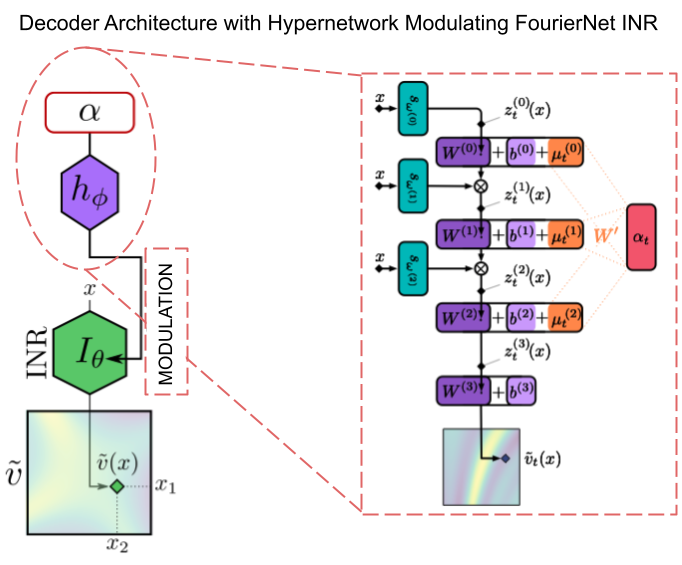

In [9]:
import math
from torch import Tensor


class CodeBilinear(nn.Module):
    __constants__ = ['in1_features', 'in2_features', 'out_features']
    in1_features: int
    in2_features: int
    out_features: int
    weight: Tensor

    def __init__(self, in1_features: int, in2_features: int, out_features: int, device=None, dtype=None) -> None:
        """
        x2T A + B x1
        x2: code, x1: spatial coordinates
        """
        factory_kwargs = {'device': device, 'dtype': dtype}
        super(CodeBilinear, self).__init__()
        self.in1_features = in1_features
        self.in2_features = in2_features
        self.out_features = out_features
        self.A = nn.Parameter(torch.empty(out_features, in2_features, **factory_kwargs))
        self.B = nn.Parameter(torch.empty(out_features, in1_features, **factory_kwargs))
        self.bias = nn.Parameter(torch.empty(out_features, **factory_kwargs))
        self.reset_parameters()

    def reset_parameters(self) -> None:
        bound = 1 / math.sqrt(self.in1_features)
        nn.init.kaiming_uniform_(self.A, a=math.sqrt(5))
        nn.init.kaiming_uniform_(self.B, a=math.sqrt(5))
        nn.init.uniform_(self.bias, -bound, bound)

    def forward(self, input1: Tensor, input2: Tensor) -> Tensor:
        # input1: b, t, h, w, s, i
        # input2: b, t, s, j
        # W: o, i, j
        # B: o, i
        # A: o, j
        # bias: o
        res = 0

        bias_code = torch.einsum('btsj,oj->btso', input2, self.A)
        bias_code = bias_code.unsqueeze(2).unsqueeze(2)

        linear_trans_2 = torch.einsum('bthwsi,oi->bthwso', input1, self.B)

        res += linear_trans_2
        res += bias_code
        res += self.bias
        return res

    def extra_repr(self) -> str:
        return 'in1_features={}, in2_features={}, out_features={}, bias={}'.format(
            self.in1_features, self.in2_features, self.out_features, self.bias is not None)


class MFNBase(nn.Module):
    def __init__(self, in_size, hidden_size, code_size, out_size, n_layers):
        super().__init__()
        self.first = 3
        self.bilinear = nn.ModuleList(
            [CodeBilinear(in_size, code_size, hidden_size)] +
            [CodeBilinear(hidden_size, code_size, hidden_size) for _ in range(int(n_layers))]
        )
        self.output_bilinear = nn.Linear(hidden_size, out_size)
        return

    def forward(self, x, code):
        out = self.filters[0](x) * self.bilinear[0](x*0., code)
        for i in range(1, len(self.filters)):
            out = self.filters[i](x) * self.bilinear[i](out, code)
        out = self.output_bilinear(out)
        if out.shape[-1] == 1:
            out = out.squeeze(-1)
        return out, x


class FourierLayer(nn.Module):
    def __init__(self, in_features, out_features, weight_scale):
        super().__init__()
        self.weight = nn.Parameter(torch.empty((out_features, in_features)))
        self.weight_scale = weight_scale
        self.reset_parameters()

    def reset_parameters(self) -> None:
        nn.init.kaiming_uniform_(self.weight, a=math.sqrt(5))

    def forward(self, x):
        return torch.cat([torch.sin(F.linear(x, self.weight * self.weight_scale)), torch.cos(F.linear(x, self.weight * self.weight_scale))], dim=-1)


class FourierNet(MFNBase):
    def __init__(self, in_size, hidden_size, code_size, out_size, n_layers=3, input_scale=256.0, **kwargs):
        super().__init__(in_size, hidden_size, code_size, out_size, n_layers)
        self.filters = nn.ModuleList(
                [FourierLayer(in_size, hidden_size // 2, input_scale / np.sqrt(n_layers + 1)) for _ in range(n_layers + 1)])

    def get_filters_weight(self):
        weights = list()
        for ftr in self.filters:
            weights.append(ftr.weight)
        return torch.cat(weights)


class Decoder(nn.Module):
    def __init__(self, state_c, hidden_c, code_c, coord_dim, n_layers, **kwargs):
        super().__init__()
        self.state_c = state_c
        self.hidden_c = hidden_c
        self.coord_dim = coord_dim
        self.out_dim = 1
        self.code_dim = code_c
        self.net = FourierNet(self.coord_dim, self.hidden_c, self.code_dim, self.out_dim, n_layers, input_scale=64)

    def forward(self, x, codes=None):
        if codes is None:
            return self.net(x)
        return self.net(x, codes)

### Dynamics model: $\frac{d\alpha_t}{dt} = f_\psi(\alpha_t)$

Finally, the dynamics model $f_{\psi}\colon \mathbb{R}^{d_\alpha}\rightarrow\mathbb{R}^{d_\alpha}$ defines a flow via an ODE in the latent space. This makes sure that the latent $\alpha_t$ can be time-evolved to some $\alpha_T$ for decoding and forecasting.


In [10]:
class Derivative(nn.Module):
    def __init__(self, state_c, code_c, hidden_c, **kwargs):
        super().__init__()
        input_dim = code_c * state_c
        self.net = MLP(input_dim, hidden_c, nl='swish')

    def forward(self, t, u):
        return self.net(u)

### Overall flow:

Combined altogether, our components define the following flow in the input space that can approximate the data flow $\Phi$ as    

$$\forall(t, \tau), \qquad (v_t, \tau) \mapsto D_\phi(E_\varphi(v_t) + \int_t^{t+\tau} f_\psi(\alpha_{\tau'}) d \tau') \quad \text{ where }\alpha_t=E_\varphi(v_t).$$

## Training






The above architecture boils down to a two-fold optimisation procedure, given by:

$$\min_\psi \ell_\text{dyn}(\psi, \alpha_\mathcal{T}) \triangleq \mathbb{E}_{v \in \mathcal{D}, t \in \mathcal{T}} \left\|\alpha_t^v - \left(\alpha_0^v + \int_0^t f_\psi(\alpha_\tau^v) d\tau\right)\right\|_2^2$$

$$\text{s.t. } \alpha_\mathcal{T}, \phi = \arg\min_{\alpha_\mathcal{T},\phi} L_\text{dec}(\phi, \alpha_\mathcal{T}) \triangleq \mathbb{E}_{v \in \mathcal{D}, x \in \mathcal{X}_v, t \in \mathcal{T}} \left\|v_t(x) - D_\phi(\alpha_t^v)(x)\right\|_2^2.$$

### Implementation of training

Input: $\mathcal{D} = \{v_\mathcal{T}\}$, $\{\alpha_\mathcal{T}^v \leftarrow 0\}_{v \in \mathcal{D}}$, $\phi \leftarrow \phi_0$, $\psi \leftarrow \psi_0$;

*While not converged, do:*

$\quad \text{for } v \in \mathcal{D} \text{, do } \alpha_\mathcal{T}^v \leftarrow \alpha_\mathcal{T}^v - \eta_\alpha \nabla_{\alpha_\mathcal{T}^v}L_\text{dec}(\phi, \alpha_\mathcal{T}^v); \qquad $ `/* Modulation */`

$\quad \phi \leftarrow \phi - \eta_\phi \nabla_\phi \left(\sum_{v \in \mathcal{D}} L_\text{dec}(\phi, \alpha_\mathcal{T}^v)\right); \qquad $ `/* Hypernetwork update */`

$\quad \psi \leftarrow \psi - \eta_\psi \nabla_\psi \left(\sum_{v \in \mathcal{D}} L_\text{dyn}(\psi, \alpha_\mathcal{T}^v)\right); \qquad$  `/* Dynamics update */`

### Implementation of Inference

Input: $\mathcal{D}' = \{v_0\}$, $\{\alpha_0^v \leftarrow 0\}_{v \in \mathcal{D}'}$, $\phi^*, \psi^*, \mathcal{T}' \neq \mathcal{T}$;

*While not converged, do:*

$\quad \textit{for } v \in \mathcal{D}' \textit{, do } \alpha_0^v \leftarrow \alpha_0^v - \eta\nabla_{\alpha_0^v}L_\text{dec}(\phi^*, \alpha_0^v); \qquad $ `/* Modulation */`

$\text{for } v \in \mathcal{D}', t \in \mathcal{T}' \text{, do}$

$\quad \alpha_t^v \leftarrow \alpha_0^v + \int_0^t f_{\psi^*}(\alpha_\tau^v) d\tau; \qquad$ `/* Unroll dynamics */`

$\quad \tilde{v}_t \leftarrow D_\phi(\alpha_t^v); \qquad$ `/* Predict */`


# Part 3

## PDE forecasting on a new equation

Since the task is PDE forecasting, `DINo` uses PDEs as datasets. The authors use 3 popular PDEs: (i) Navier-Stokes, (ii) 2D wave, (iii) Spherical Shallow Water.

We use a new PDE for this tutorial, the humble Heat equation: $\frac{\partial}{\partial t}u(x, t) = k \frac{\partial^2}{\partial x^2} u(x, t)$

#### Download `py-pde` to use PDE data

In [11]:
!pip install py-pde

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 330.7/330.7 kB 8.5 MB/s eta 0:00:00


#### Define the Heat Equation Dataset Class

We initialise a temperature field which changes over time. Note: the grid is initialised as a Gaussian Random Field for smoother results and stable training, for the heat equation as well as the others.

In [12]:
import math

import numpy as np
import torch
from pde import CartesianGrid, MemoryStorage, ScalarField
from pde.pdes import DiffusionPDE, WavePDE
from torch.utils.data import Dataset


def get_mgrid(sidelen, vmin=-1, vmax=1, dim=2):
    """
    Generates a flattened grid of (x,y,...) coordinates in a range of -1 to 1.
    sidelen: int
    dim: int
    """
    if isinstance(sidelen, int):
        tensors = tuple(dim * [torch.linspace(vmin, vmax, steps=sidelen)])
    elif isinstance(sidelen, (list, tuple)):
        if isinstance(vmin, (list, tuple)) and isinstance(vmax, (list, tuple)):
            tensors = tuple([torch.linspace(mi, ma, steps=l) for mi, ma, l in zip(vmin, vmax, sidelen)])
        else:
            tensors = tuple([torch.linspace(vmin, vmax, steps=l) for l in sidelen])
    mgrid = torch.stack(torch.meshgrid(*tensors, indexing='ij'), dim=-1)
    return mgrid


class GaussianRF(object):
    def __init__(self, dim, size, alpha=2, tau=3, sigma=None):
        self.dim = dim
        if sigma is None:
            sigma = tau ** (0.5 * (2 * alpha - self.dim))
        k_max = size // 2
        if dim == 1:
            k = torch.cat((torch.arange(start=0, end=k_max, step=1), torch.arange(start=-k_max, end=0, step=1)), 0)
            self.sqrt_eig = size * math.sqrt(2.0) * sigma * ((4 * (math.pi ** 2) * (k ** 2) + tau ** 2) ** (-alpha / 2.0))
            self.sqrt_eig[0] = 0.
        elif dim == 2:
            wavenumers = torch.cat((torch.arange(start=0, end=k_max, step=1),
                                    torch.arange(start=-k_max, end=0, step=1)), 0).repeat(size, 1)
            k_x = wavenumers.transpose(0, 1)
            k_y = wavenumers
            self.sqrt_eig = (size ** 2) * math.sqrt(2.0) * sigma * (
                        (4 * (math.pi ** 2) * (k_x ** 2 + k_y ** 2) + tau ** 2) ** (-alpha / 2.0))
            self.sqrt_eig[0, 0] = 0.0
        elif dim == 3:
            wavenumers = torch.cat((torch.arange(start=0, end=k_max, step=1),
                                    torch.arange(start=-k_max, end=0, step=1)), 0).repeat(size, size, 1)
            k_x = wavenumers.transpose(1, 2)
            k_y = wavenumers
            k_z = wavenumers.transpose(0, 2)
            self.sqrt_eig = (size ** 3) * math.sqrt(2.0) * sigma * (
                        (4 * (math.pi ** 2) * (k_x ** 2 + k_y ** 2 + k_z ** 2) + tau ** 2) ** (-alpha / 2.0))
            self.sqrt_eig[0, 0, 0] = 0.0
        self.size = []
        for j in range(self.dim):
            self.size.append(size)
        self.size = tuple(self.size)

    def sample(self):
        coeff = torch.randn(*self.size, dtype=torch.cfloat)
        coeff = self.sqrt_eig * coeff
        u = torch.fft.ifftn(coeff)
        u = u.real
        return u


##############
# Gray-Scott #
##############

class AbstractDataset(Dataset):
    def __init__(self, n_seq, n_seq_per_traj, size, t_horizon, dt, n_frames_train, buffer_shelve, group, scale=1, *args, **kwargs):
        super().__init__()
        self.n_seq = n_seq
        self.n_seq_per_traj = n_seq_per_traj
        self.size = size  # size of the 2D grid
        self.t_horizon = float(t_horizon)  # total time
        self.n = int(t_horizon / dt)  # number of iterations
        self.dt_eval = float(dt)
        assert group in ['train', 'train_eval', 'test', 'test_hr']
        self.group = group
        self.max = np.iinfo(np.int32).max
        self.buffer = dict()
        self.buffer_shelve = buffer_shelve
        self.n_frames_train = n_frames_train
        self.scale = scale

    def _get_init_cond(self, index):
        raise NotImplementedError

    def _generate_trajectory(self, traj_id):
        raise NotImplementedError

    def _load_trajectory(self, traj_id):
        raise NotImplementedError

    def __getitem__(self, index):
        t = torch.arange(0, self.t_horizon, self.dt_eval).float()
        traj_id = index // self.n_seq_per_traj
        seq_id = index % self.n_seq_per_traj
        if self.buffer.get(f'{traj_id}') is None:
            if self.buffer_shelve is not None:
                if self.buffer_shelve.get(f'{traj_id}') is None:
                    self._generate_trajectory(traj_id)
                self.buffer[f'{traj_id}'] = self.buffer_shelve[f'{traj_id}']
            else:
                self.buffer[f'{traj_id}'] = self._load_trajectory(traj_id)

        data = self.buffer[f'{traj_id}']['data'][:, seq_id * self.n:(seq_id + 1) * self.n]  # (n_ch, T, H, W)
        data = torch.tensor(data).float().permute(1, 2, 3, 0)  # (T, H, W, n_ch)
        if self.group == 'train':
            data = data[:self.n_frames_train] / self.scale
            t = t[:self.n_frames_train]

        return {
            'data': data,
            't': t,
            'traj': traj_id,
            'index': index,
            'coords': self.coords,
        }

    def __len__(self):
        return self.n_seq


#################
# Heat Equation #
#################

class HeatEquationDataset(AbstractDataset):
    def __init__(self, param, *args, **kwargs):
        super().__init__(*args, **kwargs)
        self.grid = CartesianGrid([[-1., 1.]] * 2, [self.size, self.size], periodic=False)
        self.eqs = DiffusionPDE(**param)
        self.coords = get_mgrid(self.size, vmin=-1, vmax=1, dim=2)
        self.coord_dim = self.coords.shape[-1]
        self.grf_sampler = GaussianRF(dim=2, size=self.size, alpha=2.5, tau=7)

    def _get_init_cond(self, index):
        np.random.seed(index if self.group != 'test' else self.max - index)
        init_cond = self.grf_sampler.sample().numpy()
        u = ScalarField(self.grid, init_cond)
        return u

    def _generate_trajectory(self, traj_id):
        print(f'generating {traj_id}')
        storage = MemoryStorage()
        state = self._get_init_cond(traj_id)
        self.eqs.solve(state, t_range=self.t_horizon * self.n_seq_per_traj, dt=1e-3, tracker=storage.tracker(self.dt_eval))
        buffered_data = [np.expand_dims(item, axis=0) for item in storage.data]
        self.buffer_shelve[f'{traj_id}'] = {'data': np.stack(buffered_data, axis=1)}

## Evaluation and visualisation of Heat PDE Forecasting

Given an input test PDE at $v_0(x)$ at $t=0$, `DINo` encodes $v_0$ to $\alpha_0$. Next, for $0 < t \leq T$, $\alpha_0$ is time-evolved to $\alpha_t = \alpha_0 + \int_0^t f_\psi(\alpha_\tau) d\tau$. Then, $\alpha_t$ is decoded to the predicted/forecasted value of the PDE $\tilde{v}_t$.

#### Install the `torchdiffeq` package which integrates PyTorch with PDEs & ODEs.



In [13]:
!pip install torchdiffeq

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 363.4/363.4 MB 3.9 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 13.8/13.8 MB 50.7 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 24.6/24.6 MB 41.6 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 883.7/883.7 kB 36.0 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 664.8/664.8 MB 2.0 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 211.5/211.5 MB 6.1 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 56.3/56.3 MB 14.0 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 127.9/127.9 MB 8.3 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 207.5/207.5 MB 6.4 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 21.1/21.1 MB 32.5 MB/s eta 0:00:00
  Attempting uninstall: nvidia-nvjitlink-cu12
    Found existing installation: nvidia-nvjitlink-cu12 12.5.82
    Uninstalling nvidia-nvjitlink-cu12-12.5.82:
      Successfully uninstalled nvidia-nvjitlin

#### Define the config and data loading

In [14]:
import math
import os
import shelve

import matplotlib.animation as animation
import matplotlib.pyplot as plt
import numpy as np
import torch
from IPython.display import Image
from torch import nn
from torch.utils.data import DataLoader
from torchdiffeq import odeint


def generate_mask(h_size, w_size, device, mask_data=0, n_mask=1):
    mask_list = []
    for _ in range(n_mask):
        mask_list.append((torch.rand(h_size, w_size) >= mask_data)[None, :])
    mask = torch.cat(mask_list, dim=0).squeeze()
    return mask.to(device)


def DataLoaderODE(dataset, minibatch_size, is_train=True):
    dataloader_params = {
        'dataset': dataset,
        'batch_size': minibatch_size,
        'shuffle': is_train,
        'num_workers': 0,  # for main thread
        'pin_memory': True,
        'drop_last': False
    }
    return DataLoader(**dataloader_params)


def process_config(buffer_file_ts, device="gpu:0", mask_data=0.0, n_frames_train=10, size=64):
    coord_dim = 2
    minibatch_size = 16
    dataset_tr_params = {
        "n_seq": 512, "n_seq_per_traj": 2, "t_horizon": 5, "dt": 0.25, "size": size, "group": "train",
        'n_frames_train': n_frames_train, "param": {"diffusivity": 0.1}}
    dataset_ts_params = dict()
    dataset_ts_params.update(dataset_tr_params)
    dataset_ts_params["group"] = "test"
    buffer_shelve_ts = shelve.open(buffer_file_ts)
    dataset_ts_params["n_seq"] = 32
    dataset_ts = HeatEquationDataset(buffer_shelve=buffer_shelve_ts, **dataset_ts_params)
    coord_dim = dataset_ts.coord_dim
    size = (size, size)
    mask_ts = generate_mask(size[0], size[1], device, mask_data)

    dataloader_ts = DataLoaderODE(dataset_ts, minibatch_size, is_train=False)
    return mask_ts, coord_dim, dataset_ts_params, dataloader_ts

#### Main evaluator code:

In [15]:
def set_requires_grad(module, tf=False):
    module.requires_grad = tf
    for param in module.parameters():
        param.requires_grad = tf


def eval_dino(dataloader, net_dyn, net_dec, device, method, criterion, mask_data, mask, state_dim, code_dim,
              coord_dim, n_frames_train=0, states_params=None, lr_adapt=0.0, dataset_params=None, n_steps=300,
              save_best=True):
    """
    In_t: loss within train horizon.
    Out_t: loss outside train horizon.
    In_s: loss within observation grid.
    Out_s: loss outside observation grid.
    loss: loss averaged across in_t/out_t and in_s/out_s
    loss_in_t: loss averaged across in_s/out_s for in_t.
    loss_in_t_in_s, loss_in_t_out_s: loss in_t + in_s / out_s
    """
    loss, loss_out_t, loss_in_t, loss_in_t_in_s, loss_in_t_out_s, loss_out_t_in_s, loss_out_t_out_s = 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0
    gts, mos = [], []
    set_requires_grad(net_dec, False)
    set_requires_grad(net_dyn, False)
    for j, batch in enumerate(dataloader):
        ground_truth = batch['data'].to(device)
        t = batch['t'][0].to(device)
        index = batch['index'].to(device)
        model_input = batch['coords'].to(device)
        b_size, t_size, h_size, w_size, _ = ground_truth.shape
        if lr_adapt != 0.0:
            loss_min_test = 1e30
            states_params_out = nn.ParameterList([nn.Parameter(torch.zeros(1, code_dim * state_dim).to(device)) for _ in range(dataset_params["n_seq"])])
            optim_states_out = torch.optim.Adam(states_params_out, lr=lr_adapt)
            for i in range(n_steps):
                states_params_index = [states_params_out[d] for d in index]
                states_params_index = torch.stack(states_params_index, dim=1)
                states = states_params_index.permute(1, 0, 2).view(b_size, 1, state_dim, code_dim)
                model_input_exp = model_input.view(b_size, 1, h_size, w_size, 1, coord_dim)
                model_input_exp = model_input_exp.expand(b_size, 1, h_size, w_size, state_dim, coord_dim)
                model_output, _ = net_dec(model_input_exp, states)
                loss_l2 = criterion(model_output[:, :, mask, :], ground_truth[:, 0:1, mask, :])
                if loss_l2 < loss_min_test and save_best:
                    loss_min_test = loss_l2
                    best_states_params_index = states_params_index
                loss_opt_new = loss_l2

                loss_opt = loss_opt_new
                optim_states_out.zero_grad(True)
                loss_opt.backward()
                optim_states_out.step()
            if save_best:
                states_params_index = best_states_params_index
        with torch.no_grad():
            if lr_adapt == 0.0:
                states_params_index = [states_params[d] for d in index]
                states_params_index = torch.stack(states_params_index, dim=1)
            model_input_exp = model_input.view(b_size, 1, h_size, w_size, 1, coord_dim)
            model_input_exp = model_input_exp.expand(b_size, t_size, h_size, w_size, state_dim, coord_dim)
            codes = odeint(net_dyn, states_params_index[0], t, method=method)  # t x batch x dim
            codes = codes.permute(1, 0, 2).view(b_size, t_size, state_dim, code_dim)  # batch x t x dim
            model_output, _ = net_dec(model_input_exp, codes)
            if n_frames_train != 0:
                loss_in_t += criterion(model_output[:, :n_frames_train, :, :, :], ground_truth[:, :n_frames_train, :, :, :])
                loss += criterion(model_output, ground_truth)
            loss_out_t += criterion(model_output[:, n_frames_train:, :, :, :], ground_truth[:, n_frames_train:, :, :, :])
            if mask_data != 0.0:
                loss_in_t_in_s += criterion(model_output[:, :n_frames_train, mask, :], ground_truth[:, :n_frames_train, mask, :])
                loss_in_t_out_s += criterion(model_output[:, :n_frames_train, ~mask, :], ground_truth[:, :n_frames_train, ~mask, :])
                loss_out_t_in_s += criterion(model_output[:, n_frames_train:, mask, :], ground_truth[:, n_frames_train:, mask, :])
                loss_out_t_out_s += criterion(model_output[:, n_frames_train:, ~mask, :], ground_truth[:, n_frames_train:, ~mask, :])
            gts.append(ground_truth.cpu())
            mos.append(model_output.cpu())
    loss /= len(dataloader)
    loss_in_t /= len(dataloader)
    loss_out_t /= len(dataloader)
    loss_out_t_in_s /= len(dataloader)
    loss_out_t_out_s /= len(dataloader)
    loss_in_t_in_s /= len(dataloader)
    loss_in_t_out_s /= len(dataloader)
    set_requires_grad(net_dec, True)
    set_requires_grad(net_dyn, True)
    return loss, loss_in_t, loss_in_t_in_s, loss_in_t_out_s, loss_out_t, loss_out_t_in_s, loss_out_t_out_s, gts, mos

### Get a cool GIF showing the predicted v/s ground-truth evolution of the wave

In [16]:
def save_pred_ani(batch_gt, batch_pred, state_idx, path, cmap='plasma', divider=1, fps=5):
    batch_gt = torch.permute(batch_gt, (1, 0, 2, 3, 4))  # Shape: [seq_len, batch_size, height, width, state_c]
    batch_pred = torch.permute(batch_pred, (1, 0, 2, 3, 4))

    seq_len, batch_size, height, width, state_c = batch_gt.shape
    t_horizon = math.ceil(seq_len / divider)

    fig, axes = plt.subplots(2, batch_size, figsize=(batch_size * 2, 4))
    images = []

    for traj in range(batch_size):
        vmax = torch.max(batch_gt[:, traj, :, :, :]).cpu().numpy()
        vmin = torch.min(batch_gt[:, traj, :, :, :]).cpu().numpy()

        img_gt = axes[0, traj].imshow(np.zeros((height, width)), vmin=vmin, vmax=vmax, cmap=cmap)
        img_pred = axes[1, traj].imshow(np.zeros((height, width)), vmin=vmin, vmax=vmax, cmap=cmap)

        axes[0, traj].set_title(f"GT {traj}")
        axes[1, traj].set_title(f"Pred {traj}")

        axes[0, traj].axis('off')
        axes[1, traj].axis('off')

        images.append((img_gt, img_pred))

    def update(t):
        for traj in range(batch_size):
            img_gt, img_pred = images[traj]

            img_gt.set_data(batch_gt[divider * t, traj, :, :, state_idx].cpu().numpy())
            img_pred.set_data(batch_pred[divider * t, traj, :, :, state_idx].cpu().numpy())

        return [img for pair in images for img in pair]

    ani = animation.FuncAnimation(fig, update, frames=t_horizon, interval=1000 // fps, blit=True)

    ani.save(path, writer="pillow", fps=fps)
    print(f"Animation saved at: {path}")

### Main experiment: train on Heat PDE data to forecast it

Since we can't train the `DINo` model on this notebook, we provide a link to download the model that we trained on Heat PDEs that we can test here.

--2025-02-20 20:03:20--  https://github.com/jaisidhsingh/piml/raw/refs/heads/main/DINo/results/heat/heat_test.shelve.dat
Resolving github.com (github.com)... 140.82.114.3
Connecting to github.com (github.com)|140.82.114.3|:443... connected.
HTTP request sent, awaiting response... 302 Found
Location: https://raw.githubusercontent.com/jaisidhsingh/piml/refs/heads/main/DINo/results/heat/heat_test.shelve.dat [following]
--2025-02-20 20:03:20--  https://raw.githubusercontent.com/jaisidhsingh/piml/refs/heads/main/DINo/results/heat/heat_test.shelve.dat
Resolving raw.githubusercontent.com (raw.githubusercontent.com)... 185.199.109.133, 185.199.111.133, 185.199.110.133, ...
Connecting to raw.githubusercontent.com (raw.githubusercontent.com)|185.199.109.133|:443... connected.
HTTP request sent, awaiting response... 200 OK
Length: 21503665 (21M) [application/octet-stream]
Saving to: ‘heat_test.shelve.dat’

heat_test.shelve.da 100%[===================>]  20.51M  --.-KB/s    in 0.09s   

2025-02-20

<ipython-input-17-466c58f3b903>:23: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  checkpoint = torch.load('model_ts.pt', map_location=device)


dict_keys(['net.bilinear.0.A', 'net.bilinear.0.B', 'net.bilinear.0.bias', 'net.bilinear.1.A', 'net.bilinear.1.B', 'net.bilinear.1.bias', 'net.bilinear.2.A', 'net.bilinear.2.B', 'net.bilinear.2.bias', 'net.bilinear.3.A', 'net.bilinear.3.B', 'net.bilinear.3.bias', 'net.output_bilinear.weight', 'net.output_bilinear.bias', 'net.filters.0.weight', 'net.filters.1.weight', 'net.filters.2.weight', 'net.filters.3.weight'])
dict_keys(['net.net.0.weight', 'net.net.0.bias', 'net.net.1.beta', 'net.net.2.weight', 'net.net.2.bias', 'net.net.3.beta', 'net.net.4.weight', 'net.net.4.bias', 'net.net.5.beta', 'net.net.6.weight', 'net.net.6.bias'])
Evaluating test...
generating 0
generating 1
generating 2
generating 3
generating 4
generating 5
generating 6
generating 7
generating 8
generating 9
generating 10
generating 11
generating 12
generating 13
generating 14
generating 15
Animation saved at: pred_ani.gif
Dataset heat, Loss_ts: 4.012e-05 In-t: 7.803e-05 In-s: 0.000e+00 Out-s: 0.000e+00 Out-t: 2.213e-06

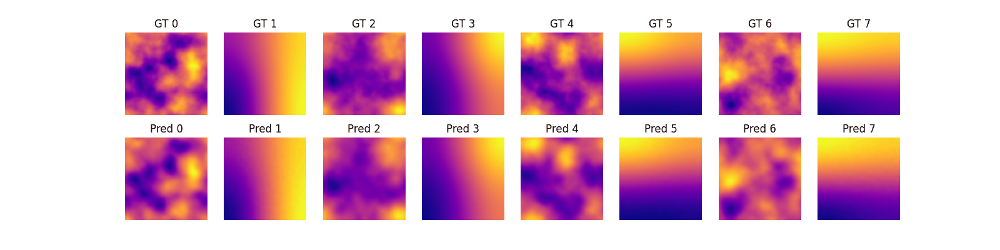

In [17]:
def set_rdm_seed(seed):
    torch.manual_seed(seed)
    if torch.cuda.is_available():
        torch.cuda.manual_seed_all(seed)


def run_test(subsampling_rate=1.0, size=64, buffer_file_ts="heat_test.shelve", out_ani_path="pred_ani.gif"):
    lr_adapt = 1e-2
    seed = 1
    n_steps = 300
    method = "rk4"
    mask_data = 1. - subsampling_rate
    device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
    set_rdm_seed(seed)

    # Config
    first = 8
    n_frames_train = 10
    mask_ts, coord_dim, dataset_ts_params, dataloader_ts \
        = process_config(buffer_file_ts, mask_data=mask_data, device=device, n_frames_train=n_frames_train, size=size)

    # Load checkpoint
    checkpoint = torch.load('model_ts.pt', map_location=device)

    net_dec_params = checkpoint["net_dec_params"]
    state_dim = net_dec_params['state_c']
    code_dim = net_dec_params['code_c']
    net_dec = Decoder(**net_dec_params)
    net_dec_dict = net_dec.state_dict()
    pretrained_dict = {k: v for k, v in checkpoint['dec_state_dict'].items() if k in net_dec_dict}
    net_dec_dict.update(pretrained_dict)
    net_dec.load_state_dict(net_dec_dict)
    print(dict(net_dec.named_parameters()).keys())

    net_dyn_params = checkpoint["net_dyn_params"]
    net_dyn = Derivative(**net_dyn_params)
    net_dyn_dict = net_dyn.state_dict()
    pretrained_dict = {k: v for k, v in checkpoint['dyn_state_dict'].items() if k in net_dyn_dict}
    net_dyn_dict.update(pretrained_dict)
    net_dyn.load_state_dict(net_dyn_dict)
    print(dict(net_dyn.named_parameters()).keys())

    net_dec = net_dec.to(device)
    net_dyn = net_dyn.to(device)
    criterion = nn.MSELoss()

    print("Evaluating test...")
    loss_ts, loss_ts_in_t, loss_ts_in_t_in_s, loss_ts_in_t_out_s, loss_ts_out_t, loss_ts_out_t_in_s, loss_ts_out_t_out_s, \
    gts, mos = eval_dino(
        dataloader_ts, net_dyn, net_dec, device, method, criterion, mask_data, mask_ts, state_dim, code_dim, coord_dim,
        n_frames_train=n_frames_train, lr_adapt=lr_adapt, dataset_params=dataset_ts_params, n_steps=n_steps, save_best=True)

    state_idx = 0
    ground_truth = gts[0]
    model_output = mos[0]

    save_pred_ani(ground_truth[:first], model_output[:first], state_idx, out_ani_path)

    print("Dataset %s, Loss_ts: %.3e In-t: %.3e In-s: %.3e Out-s: %.3e Out-t: %.3e In-s: %.3e Out-s: %.3e" % (
        "heat", loss_ts, loss_ts_in_t, loss_ts_in_t_in_s, loss_ts_in_t_out_s, loss_ts_out_t, loss_ts_out_t_in_s, loss_ts_out_t_out_s))

!wget https://github.com/jaisidhsingh/piml/raw/refs/heads/main/DINo/results/heat/heat_test.shelve.dat
!wget https://github.com/jaisidhsingh/piml/raw/refs/heads/main/DINo/results/heat/2/model_ts.pt
run_test()
Image(open("pred_ani.gif", "rb").read())

### Generalization across grids

The main benefit of `DINo` is its generalizability: it does not suffer on new types of test grids. To show this, we run an ablation where we subsample (randomly drop out parts of) the test grid. This should make it more challenging to forecast, and should reveal whether the space-time continuity is correctly executed.

#### Drop-out 50% of the test grid

Even when half of the test grid is randomly dropped, the forecasts are desirable.

<ipython-input-17-466c58f3b903>:23: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  checkpoint = torch.load('model_ts.pt', map_location=device)


dict_keys(['net.bilinear.0.A', 'net.bilinear.0.B', 'net.bilinear.0.bias', 'net.bilinear.1.A', 'net.bilinear.1.B', 'net.bilinear.1.bias', 'net.bilinear.2.A', 'net.bilinear.2.B', 'net.bilinear.2.bias', 'net.bilinear.3.A', 'net.bilinear.3.B', 'net.bilinear.3.bias', 'net.output_bilinear.weight', 'net.output_bilinear.bias', 'net.filters.0.weight', 'net.filters.1.weight', 'net.filters.2.weight', 'net.filters.3.weight'])
dict_keys(['net.net.0.weight', 'net.net.0.bias', 'net.net.1.beta', 'net.net.2.weight', 'net.net.2.bias', 'net.net.3.beta', 'net.net.4.weight', 'net.net.4.bias', 'net.net.5.beta', 'net.net.6.weight', 'net.net.6.bias'])
Evaluating test...
Animation saved at: pred_ani_s_0.5.gif
Dataset heat, Loss_ts: 4.098e-05 In-t: 7.971e-05 In-s: 7.846e-05 Out-s: 8.088e-05 Out-t: 2.250e-06 In-s: 2.265e-06 Out-s: 2.235e-06


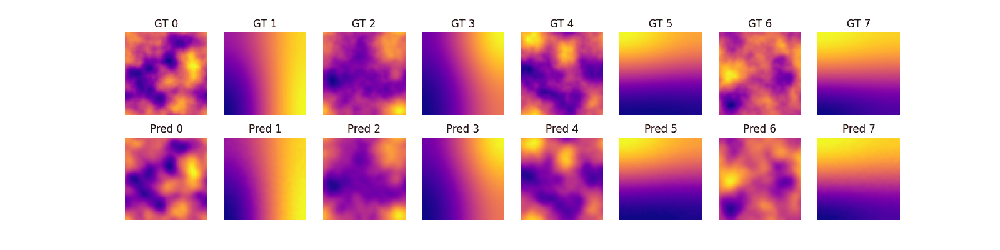

In [18]:
run_test(subsampling_rate=0.5, out_ani_path="pred_ani_s_0.5.gif")
Image(open("pred_ani_s_0.5.gif", "rb").read())

#### Drop-out 95% of the test grid

While the forecasting losses decrease in value as compared to when we dropped $50\%$ of the test grid, the forecast quality is still desirable.

<ipython-input-17-466c58f3b903>:23: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  checkpoint = torch.load('model_ts.pt', map_location=device)


dict_keys(['net.bilinear.0.A', 'net.bilinear.0.B', 'net.bilinear.0.bias', 'net.bilinear.1.A', 'net.bilinear.1.B', 'net.bilinear.1.bias', 'net.bilinear.2.A', 'net.bilinear.2.B', 'net.bilinear.2.bias', 'net.bilinear.3.A', 'net.bilinear.3.B', 'net.bilinear.3.bias', 'net.output_bilinear.weight', 'net.output_bilinear.bias', 'net.filters.0.weight', 'net.filters.1.weight', 'net.filters.2.weight', 'net.filters.3.weight'])
dict_keys(['net.net.0.weight', 'net.net.0.bias', 'net.net.1.beta', 'net.net.2.weight', 'net.net.2.bias', 'net.net.3.beta', 'net.net.4.weight', 'net.net.4.bias', 'net.net.5.beta', 'net.net.6.weight', 'net.net.6.bias'])
Evaluating test...
Animation saved at: pred_ani_s_0.05.gif
Dataset heat, Loss_ts: 9.335e-05 In-t: 1.779e-04 In-s: 9.856e-05 Out-s: 1.819e-04 Out-t: 8.814e-06 In-s: 8.578e-06 Out-s: 8.826e-06


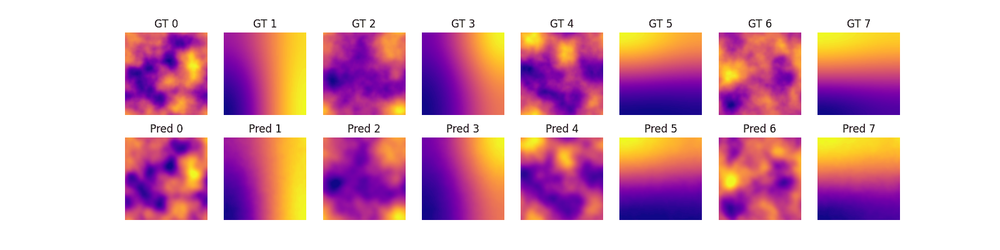

In [19]:
run_test(subsampling_rate=0.05, out_ani_path="pred_ani_s_0.05.gif")
Image(open("pred_ani_s_0.05.gif", "rb").read())

### Generalization w.r.t. input grid

Next, we vary the resolution of the grid we train on to evaluate domain-shift on `DINo`. Specifically, the resolution of the train grid is fixed to $64\times 64$, while we test on a 4 times smaller test grids of resolution $32\times 32$.

#### Test grid resolution: $32 \times 32$

--2025-02-20 20:04:49--  https://github.com/jaisidhsingh/piml/raw/refs/heads/main/DINo/results_r_32/heat/heat_test.shelve.dat
Resolving github.com (github.com)... 140.82.113.4
Connecting to github.com (github.com)|140.82.113.4|:443... connected.
HTTP request sent, awaiting response... 302 Found
Location: https://raw.githubusercontent.com/jaisidhsingh/piml/refs/heads/main/DINo/results_r_32/heat/heat_test.shelve.dat [following]
--2025-02-20 20:04:50--  https://raw.githubusercontent.com/jaisidhsingh/piml/refs/heads/main/DINo/results_r_32/heat/heat_test.shelve.dat
Resolving raw.githubusercontent.com (raw.githubusercontent.com)... 185.199.108.133, 185.199.109.133, 185.199.110.133, ...
Connecting to raw.githubusercontent.com (raw.githubusercontent.com)|185.199.108.133|:443... connected.
HTTP request sent, awaiting response... 200 OK
Length: 5381809 (5.1M) [application/octet-stream]
Saving to: ‘heat_test_32.shelve.dat’

heat_test_32.shelve 100%[===================>]   5.13M  --.-KB/s    in 0.

<ipython-input-17-466c58f3b903>:23: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  checkpoint = torch.load('model_ts.pt', map_location=device)


dict_keys(['net.bilinear.0.A', 'net.bilinear.0.B', 'net.bilinear.0.bias', 'net.bilinear.1.A', 'net.bilinear.1.B', 'net.bilinear.1.bias', 'net.bilinear.2.A', 'net.bilinear.2.B', 'net.bilinear.2.bias', 'net.bilinear.3.A', 'net.bilinear.3.B', 'net.bilinear.3.bias', 'net.output_bilinear.weight', 'net.output_bilinear.bias', 'net.filters.0.weight', 'net.filters.1.weight', 'net.filters.2.weight', 'net.filters.3.weight'])
dict_keys(['net.net.0.weight', 'net.net.0.bias', 'net.net.1.beta', 'net.net.2.weight', 'net.net.2.bias', 'net.net.3.beta', 'net.net.4.weight', 'net.net.4.bias', 'net.net.5.beta', 'net.net.6.weight', 'net.net.6.bias'])
Evaluating test...
generating 0
generating 1
generating 2
generating 3
generating 4
generating 5
generating 6
generating 7
generating 8
generating 9
generating 10
generating 11
generating 12
generating 13
generating 14
generating 15
Animation saved at: pred_ani_r_32.gif
Dataset heat, Loss_ts: 3.839e-05 In-t: 7.458e-05 In-s: 0.000e+00 Out-s: 0.000e+00 Out-t: 2.21

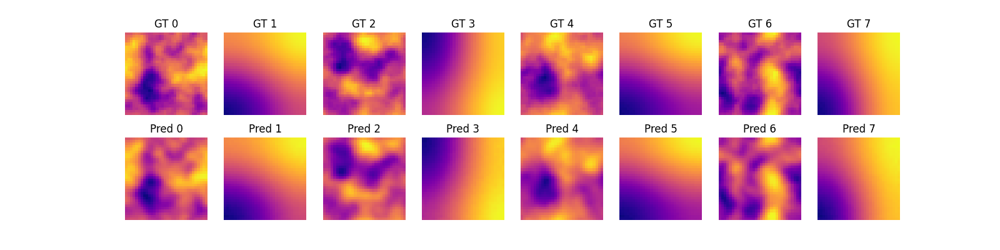

In [20]:
!wget -O "heat_test_32.shelve.dat" https://github.com/jaisidhsingh/piml/raw/refs/heads/main/DINo/results_r_32/heat/heat_test.shelve.dat
run_test(size=32, buffer_file_ts="heat_test_32.shelve", out_ani_path="pred_ani_r_32.gif")
Image(open("pred_ani_r_32.gif", "rb").read())

# Conclusion

DINo is a PDE forecasting method which expresses time-varying spatial functions as latent vectors tied to an ODE process. As shown for the Heat Equation, DINo transfers to new grid specifications well, validating its main claim towards generalisability, which comes from 3 main features:

1. The latent ODE process is what gives DINo freedom to model the PDE to long and continuous horizons without worrying about the discretized input grids.

2. The latent space is so effective only because of the space-time separated INR decoder: which instead of learning spatial distributions for various time points, learns spatial variation as a function of time.

3. The space-time separation via amplitude modulation is crucial for the expressive decoder because without modulation along time, the INR would be poorly conditioned and fail the time-evolution in the latent space.

Lastly, from a student perspective, these new ideas were quite interesting to us, which made studying DINo more meaningful.

1. auto-decoding
2. latent expression of ODEs.